In [1]:
library(plotly)
## Libraries:
library(mvtnorm) # generates multivariate Gaussian sampels and calculate the densities
library(ggplot2)
library(reshape2)

Loading required package: ggplot2


Attaching package: ‘plotly’


The following object is masked from ‘package:ggplot2’:

    last_plot


The following object is masked from ‘package:stats’:

    filter


The following object is masked from ‘package:graphics’:

    layout




## Synthesize Data

In [4]:
N <- 1000
c0 <- 0; c1 <- 1 # class labels
mu0 <- c(6.5, 0.5); p0 <- 0.60
mu1 <- c(1.0, 4.0); p1 <- 1 - p0
sigma <- matrix(c(1, 0, 0, 1), nrow=2, ncol=2, byrow = TRUE) # shared covariance matrix
sigma0 <- sigma;   sigma1 <- sigma
data <- data.frame(x1=double(), x2=double(), label=double()) # empty data.frame
## Generate class labels
data[1:N,'label'] <- sample(c(c0,c1), N, replace = TRUE, prob = c(p0, p1))
## calculate the size of each class
N0 <- sum(data[1:N,'label']==c0); N1 <- N - N0
## Sample from the Gaussian distribution accroding to the class labels and statitics.
data[data[1:N,'label']==c0, c('x1', 'x2')] <- rmvnorm(n = N0, mu0, sigma0)
data[data[1:N,'label']==c1, c('x1', 'x2')] <- rmvnorm(n = N1, mu1, sigma1)

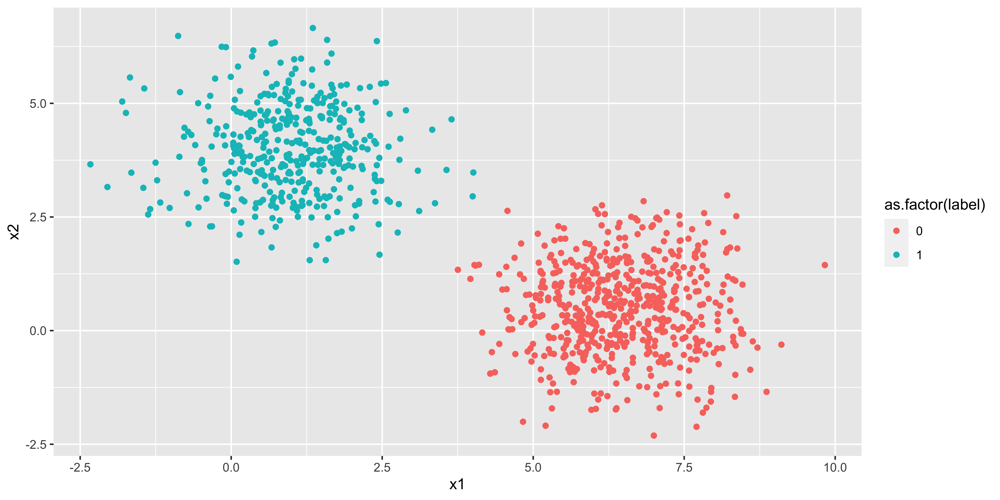

In [5]:
options(repr.plot.width=10, repr.plot.height=5, repr.plot.res=500)
ggplot(data, aes(x = x1, y = x2, color = as.factor(label))) + geom_point()

In [4]:
sigmoid <- function(x){
    1/(1+exp(-x))
}

## Defining the Loss Function

In [5]:
# define function to calculate loss using X,Y and a given arbitrary parameter vector
loss <- function(X, Y, W){
Y_hat = sigmoid(X%*%W)
loglikelihood = mean(ifelse(Y == 1,log(Y_hat), log(1-Y_hat)))
-loglikelihood
}

## Solving by Gradient Descent

In [6]:
X = matrix(cbind(1,data$x1, data$x2), ncol = 3)
Y = matrix(data$label, ncol = 1)

In [7]:
# initialise params and hyper params
W_Hat = matrix(runif(3), nrow = 3 , ncol = 1)
eta = 0.0001
epoch = 1000
epsilon = 0.0001
error = c()

We now implement Batch gradient descent using the matrix form of the gradient given by the formula:
$$\Delta L(W) = \sum(\sigma(x_iW) - y_i)x_i$$
or in vectorized form
$$\Delta L(W) = X^T(\sigma(XW) - Y)$$

To implement above, we can use the semi-vectorized form 

`
colSums(matrix(rep((sigmoid(X%*%W_Hat) - Y) , 3), ncol = 3) * X)
`

or we can use the fully vectorized form

`
t(X) %*% (sigmoid(X%*%W_Hat) - Y)
`

Moreover, for each iteration of gradient descent, we plot the line obtained to visualize convergence. 
The final line upon convergence is plotted in Blue.

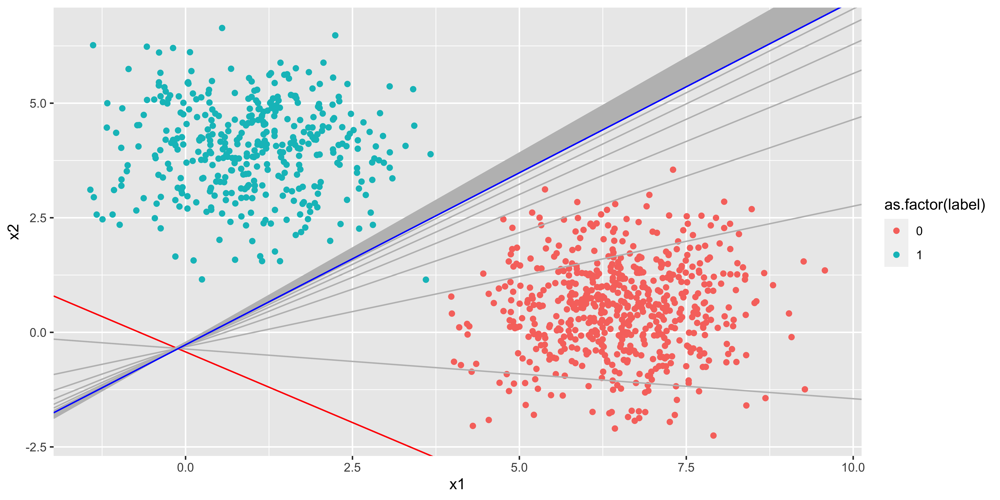

In [8]:
# implement gradient descent (batch mode) using matrix notation

# plot data and initial discrimination boundary (i.e. the random parameter initialization) in red
g <- ggplot(data, aes(x = x1, y = x2, color = as.factor(label))) +
    geom_point() + geom_abline(slope = -W_Hat[2]/W_Hat[3], intercept = -W_Hat[1]/W_Hat[3], color = 'red')

# start gradient descent
for (k in 1:epoch){
    error[k] <- loss(X, Y, W_Hat)
    #grad = colSums(matrix(rep((sigmoid(X%*%W_Hat) - Y) , 3), ncol = 3) * X)
    grad = t(X) %*% (sigmoid(X%*%W_Hat) - Y)
    W_old = W_Hat
    W_Hat = W_Hat - eta * grad
    if (abs(max(W_Hat - W_old)) < epsilon){break}
    
    # add discrimination boundary for each param update
    g <- g + geom_abline(slope = -W_Hat[2]/W_Hat[3], intercept = -W_Hat[1]/W_Hat[3], color = 'grey')
    
    }

# add final boundary in blue
g <- g + geom_abline(slope = -W_Hat[2]/W_Hat[3], intercept = -W_Hat[1]/W_Hat[3], color = 'blue')

g


In [9]:
W_Hat

0.5608762
-1.5511978
2.0664547


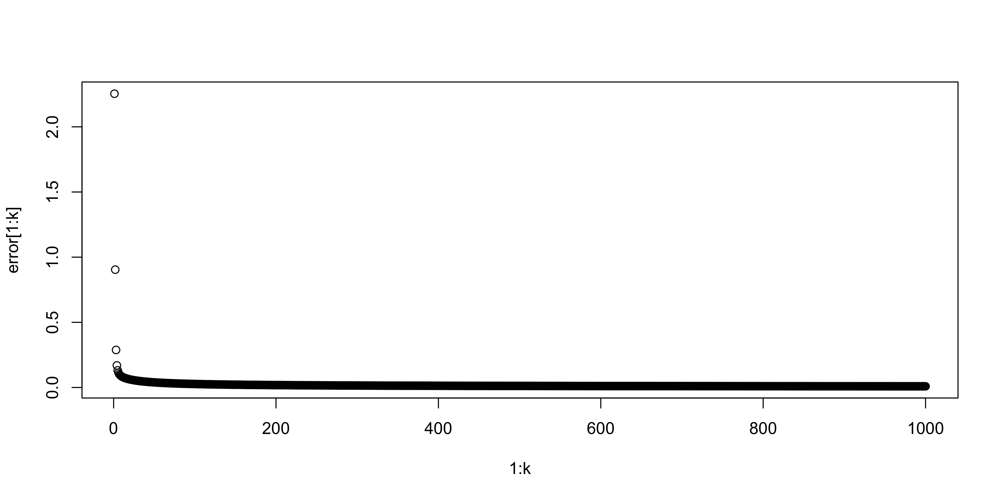

In [10]:
plot(1:k, error[1:k])

## Visualizing the Sigmoid

In [12]:
# calculate the sigmoid surface for an X1, X2 space grid
X1 <- X2 <- seq(-20, 20, length= 200)
count = 1
z = matrix(nrow = length(X1), ncol = length(X2))
for (i in 1:length(X1)){
    for (j in 1:length(X2)){
            X_grid = cbind(1, X1[i], X2[i])
            z[i,j] = sigmoid(X_grid %*% W_Hat)
            
    }
}
# plot using perspective (non interactive)
#persp(X1, X2, z, theta = 30, col = 'red')


# plot using plotly (interactive)
fig <- plot_ly(x = X1, y = X2, z = z) %>% add_surface() %>% layout(
    title = "Sigmoid Surface",
    scene = list(
      xaxis = list(title = "X1", hovertext = 'X1'),
      yaxis = list(title = "X2"),
      zaxis = list(title = "P(Y = 1)")
    )) %>%
  add_trace(
    type = 'surface',
    hovertemplate = 'X1: %{x:.2f}</br></br>X2: %{y:.2f}</br>P(y = 1): %{z:.2f}<extra></extra>',
    showlegend = FALSE
  )
fig

HTML widgets cannot be represented in plain text (need html)

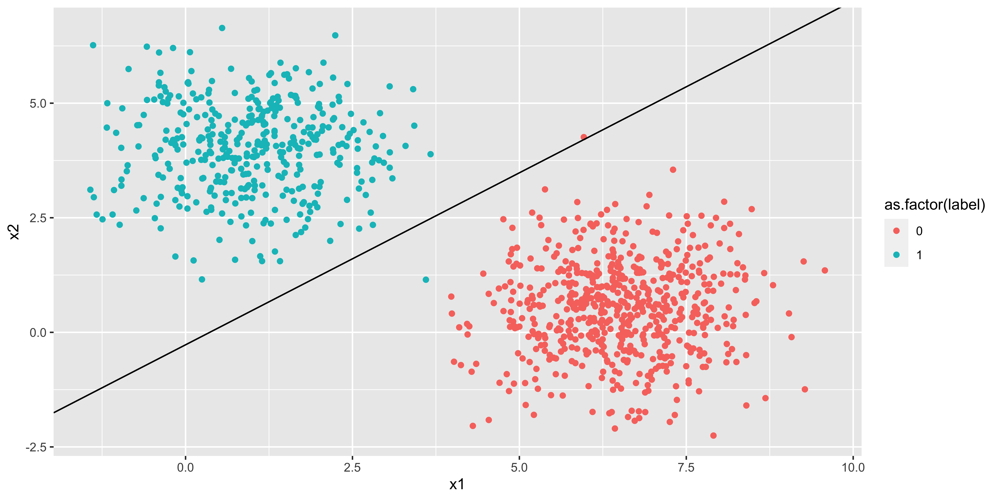

In [13]:
ggplot(data, aes(x = x1, y = x2, color = as.factor(label))) + geom_point() +
    geom_abline(slope = -W_Hat[2]/W_Hat[3], intercept = -W_Hat[1]/W_Hat[3])